This code is referenced from <br>
https://github.com/TannerGilbert/Object-Detection-and-Image-Segmentation-with-Detectron2

In [ ]:
%cd detectron2

## Download a demo dataset

In [5]:
import torch, detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In this case we will use a dataset with balloon images.

In [6]:
# write a function that loads the dataset into detectron2's standard format
import os
import numpy as np
import json
from detectron2.structures import BoxMode

def get_balloon_dicts(img_dir):
    json_file = os.path.join(img_dir, "via_region_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}
        
        filename = os.path.join(img_dir, v["filename"])
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0, # we have only 1 class == balloon
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [7]:
# set augmentation
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
import copy
import torch

def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    transform_list = [
        #T.Resize((800,600)),
        T.RandomBrightness(0.8, 1.8),
        T.RandomContrast(0.6, 1.3),
        T.RandomSaturation(0.8, 1.4),
        T.RandomRotation(angle=[90, 90]),
        T.RandomLighting(0.7),
        T.RandomFlip(prob=0.4, horizontal=False, vertical=True),
    ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict

In [8]:
from detectron2.engine import DefaultTrainer
from detectron2.data import build_detection_test_loader, build_detection_train_loader

class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

In [9]:
for d in ["train", "val"]:
    DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts("../dataset/balloon/" + d))
    MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])
balloon_metadata = MetadataCatalog.get("balloon_train")

You can go to <br>
detectron2/detectron2/model_zoo/model_zoo.py <br>
to choose a model <br>
name "my_yaml" as the location of the yaml <br>
Check <br>
https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md <br>
for details of models

In [10]:
# e.g.
my_yaml = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"

In [11]:
# start training !!
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(my_yaml))
cfg.DATASETS.TRAIN = ("balloon_train",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(my_yaml)  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 500
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (balloon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CustomTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/23 14:40:32 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[05/23 14:40:32 d2.engine.train_loop]: Starting training from iteration 0


/opt/miniconda3/envs/caradet2/lib/python3.9/site-packages/torch/functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4313.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/23 14:40:36 d2.utils.events]:  eta: 0:01:20  iter: 19  total_loss: 2.051  loss_cls: 0.6565  loss_box_reg: 0.6232  loss_mask: 0.6868  loss_rpn_cls: 0.01873  loss_rpn_loc: 0.02027    time: 0.1591  last_time: 0.1809  data_time: 0.0209  last_data_time: 0.0127   lr: 9.7405e-06  max_mem: 7853M
[05/23 14:40:40 d2.utils.events]:  eta: 0:01:14  iter: 39  total_loss: 1.849  loss_cls: 0.5747  loss_box_reg: 0.5479  loss_mask: 0.635  loss_rpn_cls: 0.04591  loss_rpn_loc: 0.01626    time: 0.1597  last_time: 0.2126  data_time: 0.0297  last_data_time: 0.0046   lr: 1.9731e-05  max_mem: 7853M
[05/23 14:40:43 d2.utils.events]:  eta: 0:01:09  iter: 59  total_loss: 1.865  loss_cls: 0.4905  loss_box_reg: 0.6737  loss_mask: 0.5537  loss_rpn_cls: 0.02242  loss_rpn_loc: 0.009804    time: 0.1568  last_time: 0.3431  data_time: 0.0333  last_data_time: 0.1743   lr: 2.972e-05  max_mem: 7853M
[05/23 14:40:46 d2.utils.events]:  eta: 0:01:04  iter: 79  total_loss: 1.461  loss_cls: 0.3837  loss_box_reg: 0.584  loss_

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:

In [12]:
cfg.INPUT.MIN_SIZE_TEST = 0 # if set to zero, we do not resize the image
cfg.INPUT.MAX_SIZE_TEST = 0 # if set to zero, we do not resize the image
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  
predictor = DefaultPredictor(cfg)

[05/23 14:41:52 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


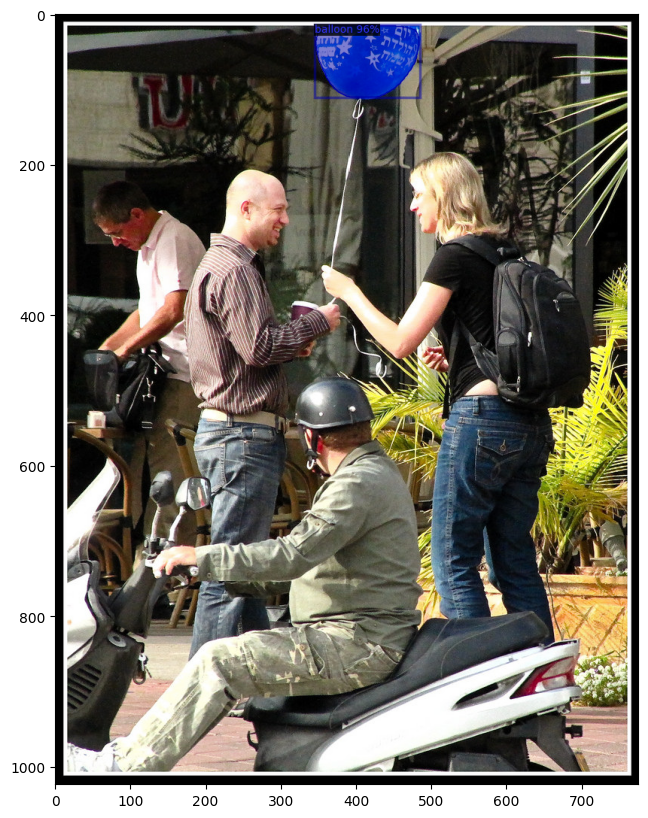

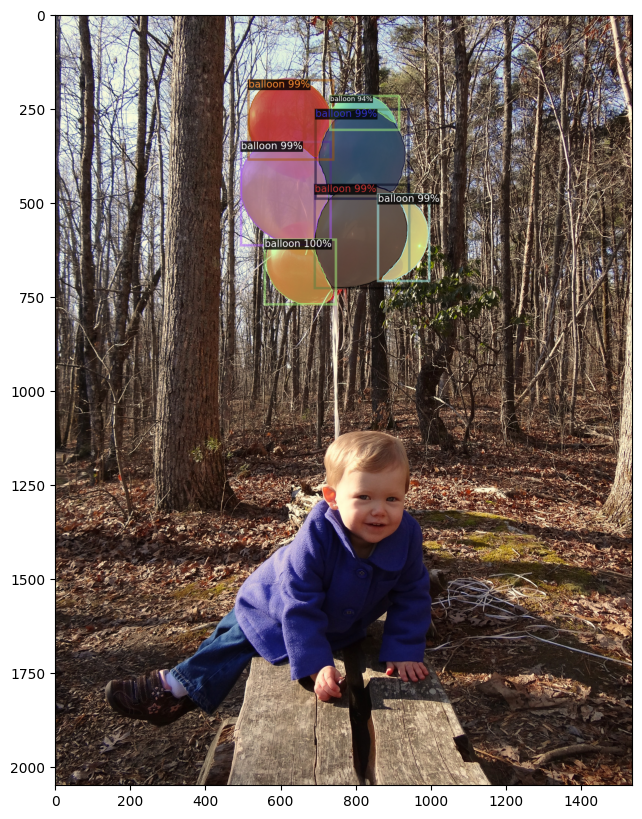

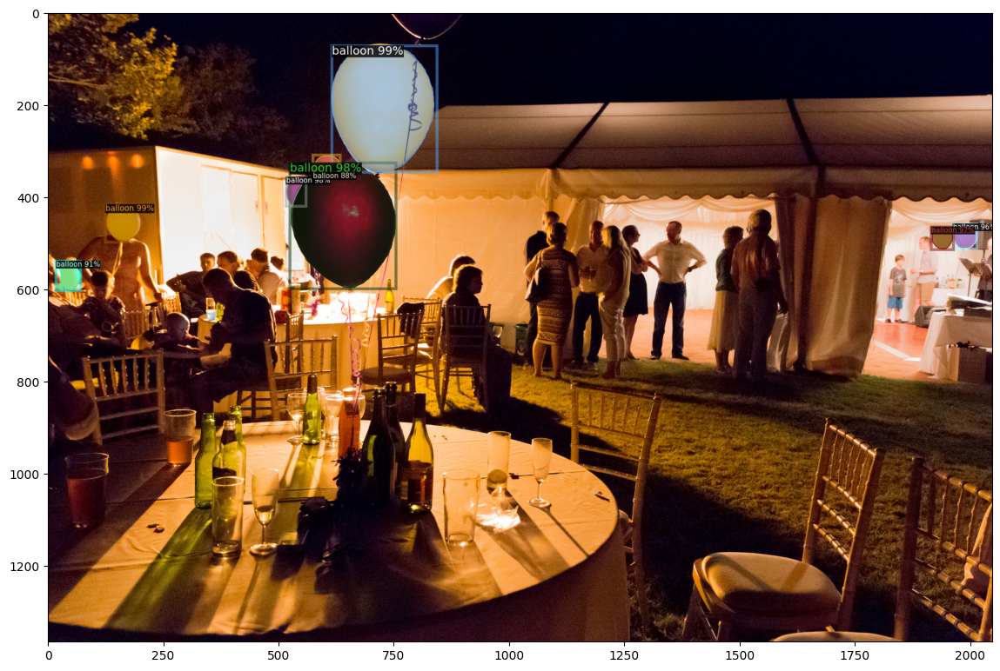

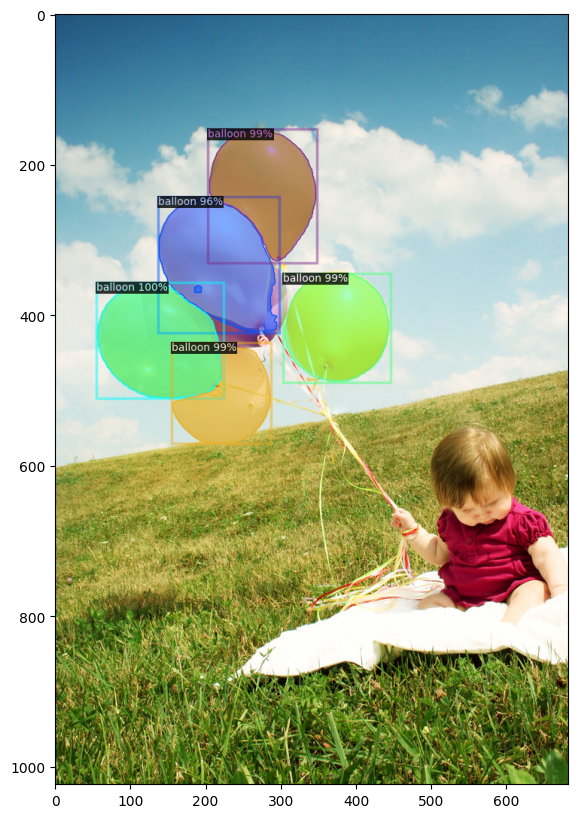

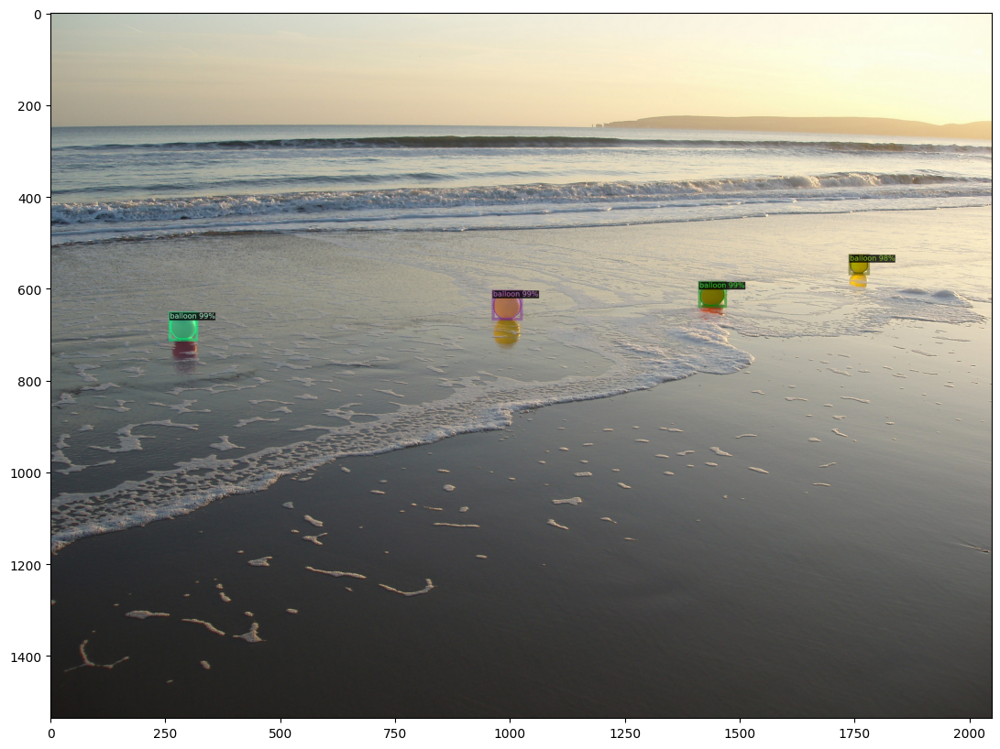

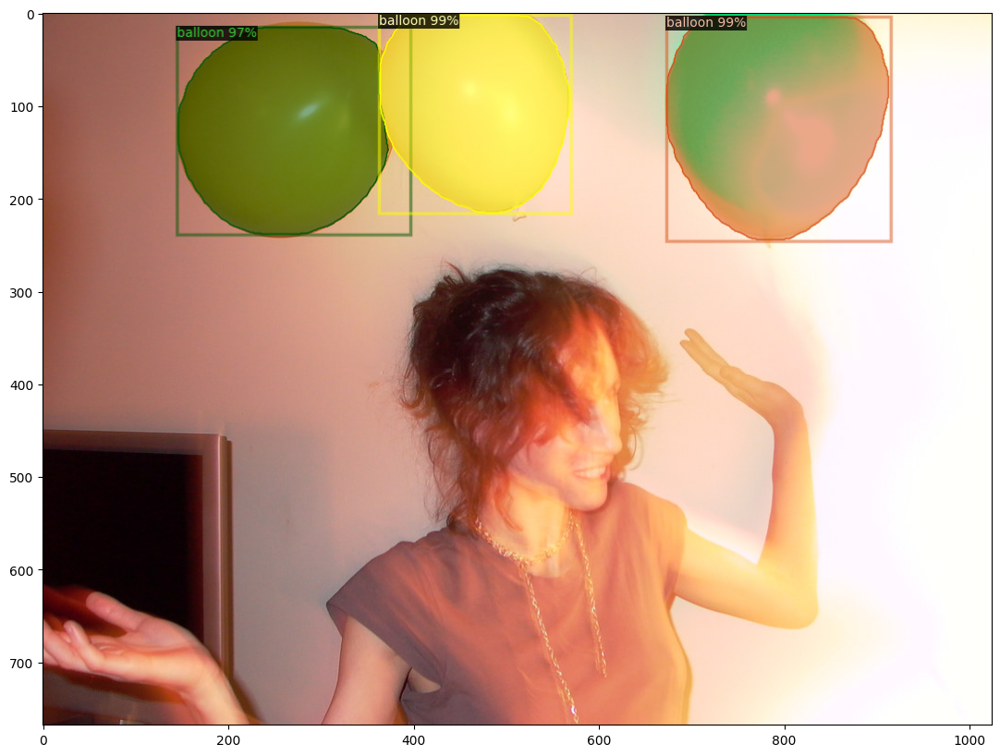

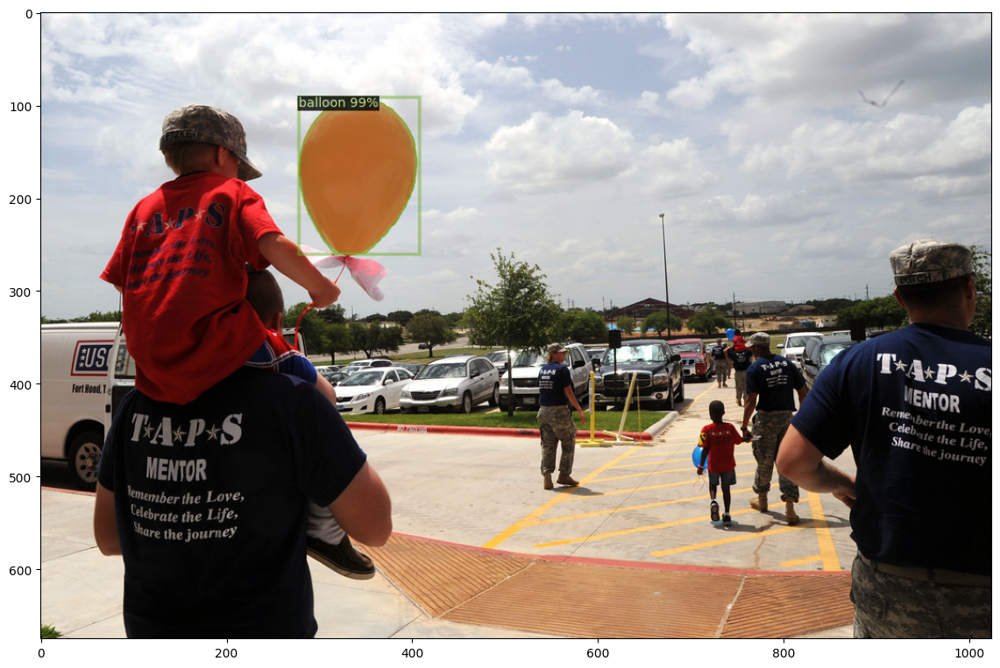

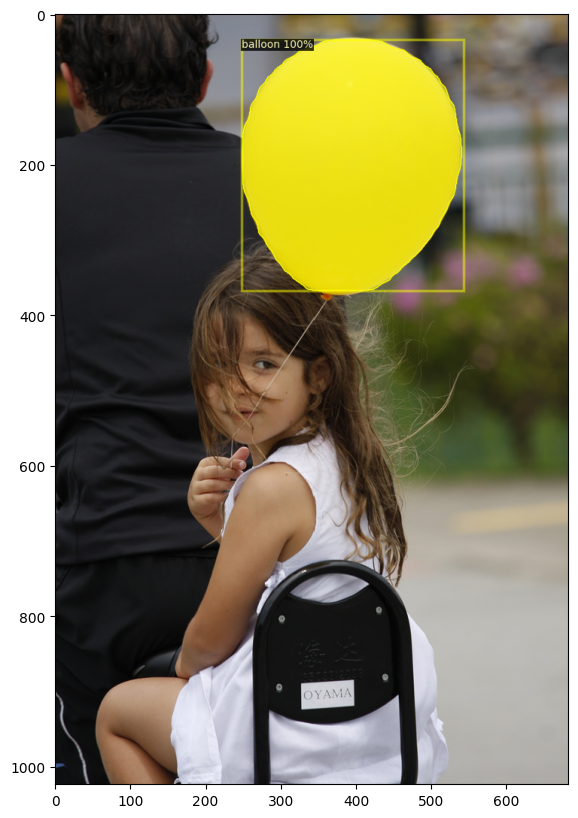

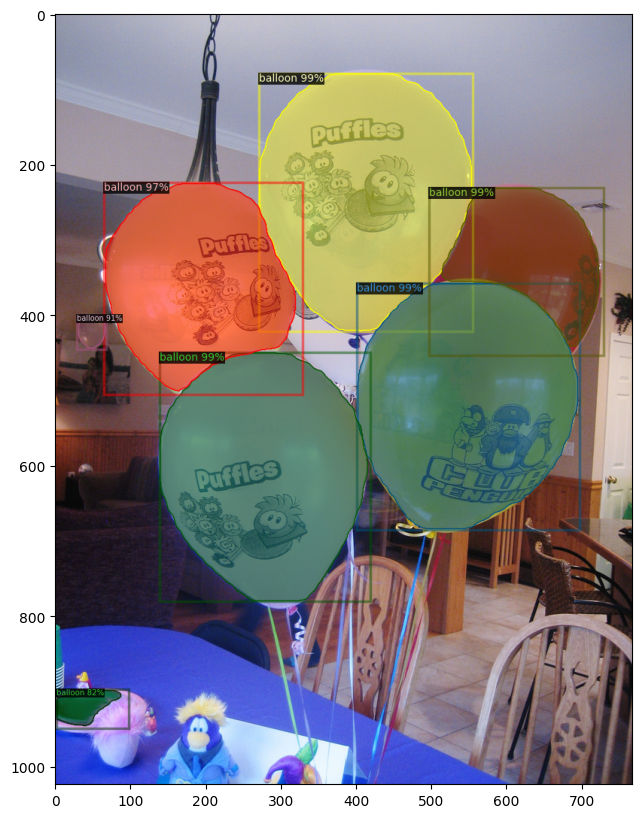

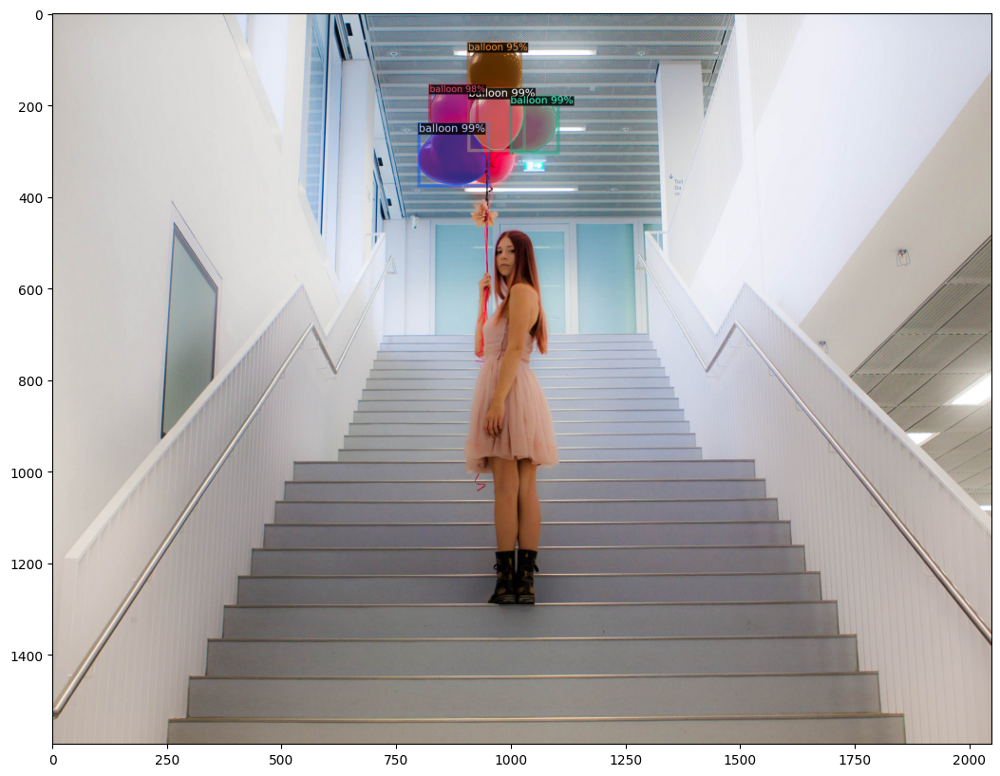

In [13]:
from detectron2.utils.visualizer import ColorMode
import random

dataset_dicts = get_balloon_dicts("../dataset/balloon/val")
for d in random.sample(dataset_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=1)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

We can also evaluate its performance using AP metric implemented in COCO API.

In [14]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("balloon_val", ("bbox",), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "balloon_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[05/23 14:42:00 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[05/23 14:42:00 d2.evaluation.coco_evaluation]: Trying to convert 'balloon_val' to COCO format ...
WARNING [05/23 14:42:00 d2.data.datasets.coco]: Using previously cached COCO format annotations at './output/balloon_val_coco_format.json'. You need to clear the cache file if your dataset has been modified.
[05/23 14:42:00 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  balloon   | 50           |
|            |              |
[05/23 14:42:00 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(0, 0), max_size=0, sample_style='choice')]
[05/23 14:42:00 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/23 14:42:00 d2.data.common]: Serializing 13 elements to byte tensors and concatenati

# Export the model to onnx

In [15]:
import torch
from detectron2.config import get_cfg
from detectron2.modeling import build_model
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.export import TracingAdapter
from detectron2.data import build_detection_test_loader
from detectron2 import model_zoo
import os
import onnx 
import cv2

my_yaml = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
# Step 1: Load the configuration and model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(my_yaml))
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.DEVICE = "cuda"
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9  # Set threshold for this demo

# Step 2: Create Pytorch Model
model = build_model(cfg)
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)
model.eval()

# Step 3: Trace the model with appropriate inputs
#im can be any image of your training/validation dataset 
im = cv2.imread("../dataset/balloon/val/14898532020_ba6199dd22_k.jpg")
im_torch = torch.as_tensor(im.astype("float32").transpose(2, 0, 1))
inputs = [{"image": im_torch}]

traceable_model = TracingAdapter(model, inputs, None)

# Step 4: Export to ONNX with appropriate dynamic axes
torch.onnx.export(traceable_model, (im_torch,), 
                  "../output/model.onnx", 
                  opset_version=16,
                  input_names = ['image'],
                  output_names = ['instances'],
                  dynamic_axes={'image' : {1 : 'height', 2: 'width'},
                                'instances' : {0 : 'batch_size'}}
                                )

[05/23 14:42:16 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/tmp/ipykernel_22884/2577792953.py:35: DeprecationWarning: You are using the legacy TorchScript-based ONNX export. Starting in PyTorch 2.8, the new torch.export-based ONNX exporter will be the default. To switch now, set dynamo=True in torch.onnx.export. This new exporter supports features like exporting LLMs with DynamicCache. We encourage you to try it and share feedback to help improve the experience. Learn more about the new export logic: https://pytorch.org/docs/stable/onnx_dynamo.html. For exporting control flow: https://pytorch.org/tutorials/beginner/onnx/export_control_flow_model_to_onnx_tutorial.html.
  torch.onnx.export(traceable_model, (im_torch,),
/home/test/d2_object_detectionv3/detectron2/detectron2/structures/image_list.py:85: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize 

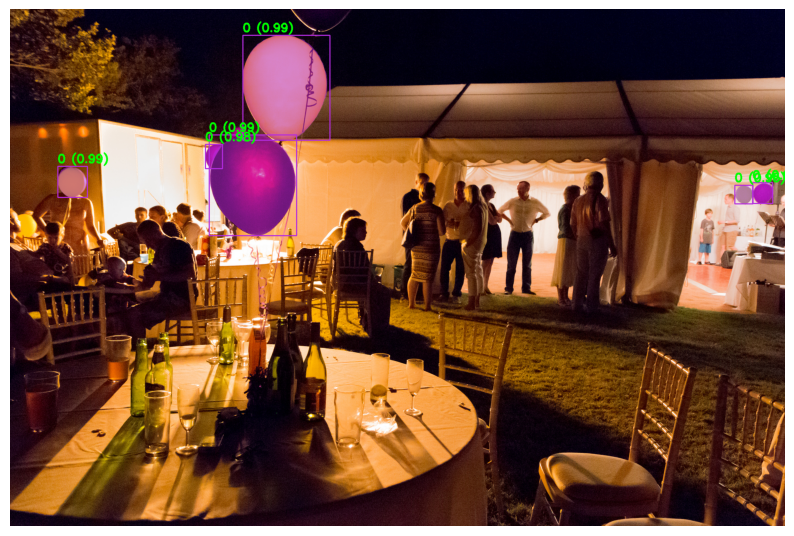

In [16]:
import cv2
import numpy as np
import onnxruntime as ort
import matplotlib.pyplot as plt

# Create an ONNX Runtime session
session = ort.InferenceSession("../output/model.onnx")

# Load image
im = cv2.imread("../dataset/balloon/val/14898532020_ba6199dd22_k.jpg")
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

# Run inference
outputs = session.run(None, {"image": im.astype("float32").transpose(2, 0, 1)})

# Get the outputs
#boxes, scores, classes, masks = outputs
boxes, classes, masks, scores,_  = outputs

# Create a list of random colors for each class
num_classes = len(np.unique(classes))  # Assuming classes are 0-indexed
colors = np.random.randint(0, 255, size=(num_classes, 3))


# Process each mask
for i in range(len(classes)):
    score = scores[i]
    class_id = int(classes[i])
    color = colors[class_id]
    mask = masks[i]

    # Create colored mask
    colored_mask = np.zeros_like(im)
    colored_mask[mask] = color

    # Add colored mask to overlay with transparency
    alpha = 0.5  # Transparency factor
    im = np.where(colored_mask != 0, 
                      cv2.addWeighted(im, 1 - alpha, colored_mask, alpha, 0),
                      im)

    # Draw bounding box and label
    box = boxes[i]
    x_min, y_min, x_max, y_max = box
    cv2.rectangle(im, (int(x_min), int(y_min)), (int(x_max), int(y_max)), 
                 color.tolist(), 2)
    cv2.putText(im, f'{class_id} ({score:.2f})', 
               (int(x_min), int(y_min - 10)),
               cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 3)

# Display the result
plt.figure(figsize=(10, 10))
plt.imshow(im)
plt.axis('off')
plt.show()